# Corona Cases in Germany - Geo Analysis for Federation States - Hotspots

On base of the data the of the [Berliner Morgenpost](https://interaktiv.morgenpost.de/corona-virus-karte-infektionen-deutschland-weltweit/) the following notebook analyzes 
- how the Corona spreads out currently in the german federation
- what the current hotspots are
- what most likely the upcoming hotspots will be

It therefore shows
- how the absolute 
  - confirmed
  - active 
  covid-19 cases are distributed among the german states
- how the relative
  - confirmed 
  - active
  covid-19 cases per 100000 inhabitants are distributed among the german states.
- how the big the growth factor is in the single german states

### Kudos ..

... to the great Data Team of the [Berliner Morgenpost](https://interaktiv.morgenpost.de/corona-virus-karte-infektionen-deutschland-weltweit/), which tirelessly collects current case data and seems to be the best informed source in Germany!!! 


In [209]:
from datetime import datetime
import numpy as np
import pandas as pd
import geopandas as gpd
import geoplot
import mapclassify
%matplotlib inline
import matplotlib.pyplot as plt

# Statistics

In [210]:
fed_inhabitants = pd.read_csv('./input/de-stats/german-federation-inhabitants.csv', thousands='.', decimal=',')
fed_inhabitants_2018 = fed_inhabitants[['Bundesland','2018']].rename(columns={'2018':'inhabitants_2018'})

In [211]:
de = gpd.read_file('./input/de-stats/german-federation-geo-adm1.shp', encoding='utf-8')

## Corona Data

In [212]:
CURRENT_DATA_URL='https://funkeinteraktiv.b-cdn.net/current.v3.csv'
HISTORY_DATA_URL='https://funkeinteraktiv.b-cdn.net/history.v3.csv'

Note: use HISTORY_DATA, because we need more dates for growth calculation

In [213]:
df = pd.read_csv(HISTORY_DATA_URL)
df['date'] = pd.to_datetime(df['date'], format="%Y%m%d")

LATEST_DATE = df.date.max() - pd.Timedelta(days=1)
history_df = df[df.date<=LATEST_DATE]

**The statistics are from:**

In [214]:
LATEST_DATE

Timestamp('2020-04-04 00:00:00')

## German Data

In [215]:
de_history_df = history_df.loc[history_df.label_parent=='Deutschland',['label','date','recovered','confirmed','deaths']]
de_history_df['active'] = de_history_df['confirmed'] - (de_history_df['recovered'] + de_history_df['deaths'])
de_by_date = de_history_df.groupby('date').sum()

### German Federal States

In [216]:
de_fed_by_date_all = de_history_df.groupby(['date','label']).sum().reset_index()
#feds = list(de_fed_by_date_all.label.unique())
feds = ['Baden-Württemberg',
 'Bayern',
 'Berlin',
 'Brandenburg',
 'Bremen',
 'Hamburg',
 'Hessen',
 'Mecklenburg-Vorpommern',
 'Niedersachsen',
 'Nordrhein-Westfalen',
 'Rheinland-Pfalz',
 'Saarland',
 'Sachsen',
 'Sachsen-Anhalt',
 'Schleswig-Holstein',
 'Thüringen']

de_fed_by_date = de_fed_by_date_all[de_fed_by_date_all.label.isin(feds)]

## Cases by Federation State

### Absolute Cases by Federation State

In [217]:
wi_df = de.merge(fed_inhabitants_2018,right_on='Bundesland', left_on='NAME_1').drop(['ID_0','ISO','NAME_0','NAME_1', 'ID_1', 'TYPE_1','ENGTYPE_1','NL_NAME_1','VARNAME_1'], axis=1)
with_inhabitants_and_cases_df = wi_df.merge(de_fed_by_date[de_fed_by_date.date==LATEST_DATE], right_on='label', left_on='Bundesland')
#with_inhabitants_and_cases_df.head()

### Fed Confirmed/Active Cases per 10000 Inhabitants

In [218]:
PER_INHABITANTS = 100000

In [219]:
confirmed_per_inhabitants = (with_inhabitants_and_cases_df['confirmed']*PER_INHABITANTS)/with_inhabitants_and_cases_df['inhabitants_2018']
active_per_inhabitants = (with_inhabitants_and_cases_df['active']*PER_INHABITANTS)/with_inhabitants_and_cases_df['inhabitants_2018']

# Current State

## Confirmed Case in the single German Federation States

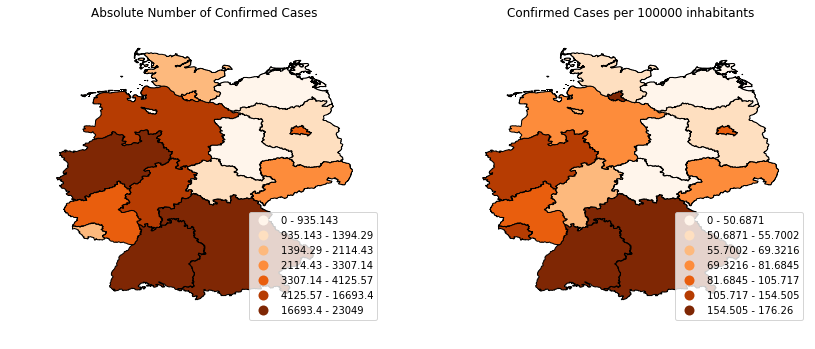

In [220]:
plt.figure(figsize=(14,9))

ax = plt.subplot(121, title = "Absolute Number of Confirmed Cases")
geoplot.choropleth(
    wi_df, hue=with_inhabitants_and_cases_df.confirmed, 
    scheme = mapclassify.Quantiles(with_inhabitants_and_cases_df.confirmed, k=7),
    cmap='Oranges', legend=True, ax=ax
);


ax = plt.subplot(122, title = "Confirmed Cases per {} inhabitants".format(PER_INHABITANTS))
geoplot.choropleth(
    wi_df, hue=confirmed_per_inhabitants, 
    scheme=mapclassify.Quantiles(confirmed_per_inhabitants, k=7),
    cmap='Oranges',legend=True, ax=ax
);

The plot of the **confirmed** cases per 100000 inhabitant shows, that Hamburg and Saarland are actually quite more affected than the absolute numbers would indicate.

In Hessen and Niedersachsen the situation seems to be quite better than the absolute numbers tell us.

## Confirmed vs. Active Case in the single German Federation States
Lets see, how many cases are actually still active and thus are still infectious and potentially have to be treated in the hospitals.

As the relative case rates per 100000 inhabitants tell us more about the actual burden, we will now compare the relative numbers instead of the absolute ones.

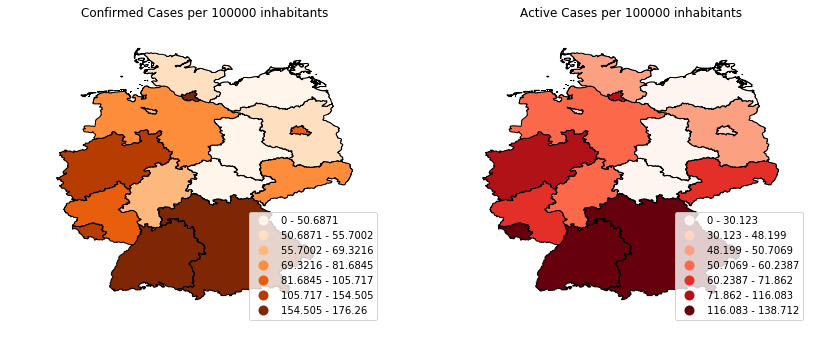

In [221]:
plt.figure(figsize=(14,18))

ax = plt.subplot(122, title = "Active Cases per {} inhabitants".format(PER_INHABITANTS))
geoplot.choropleth(
    wi_df, hue=active_per_inhabitants, 
    scheme=mapclassify.Quantiles(active_per_inhabitants, k=7),
    cmap='Reds',legend=True, ax=ax
);

ax = plt.subplot(121, title = "Confirmed Cases per {} inhabitants".format(PER_INHABITANTS))
geoplot.choropleth(
    wi_df, hue=confirmed_per_inhabitants, 
    scheme=mapclassify.Quantiles(confirmed_per_inhabitants, k=7),
    cmap='Oranges',legend=True, ax=ax
);


### Less affected states

In **Berlin** much less **active cases per 100000** inhabitants than the number of confirmed cases would indicate: Many more people seem to be recovered there than in most other german states. Also in **Bremen** the recovery rate seems to be very high.

Besides **Mecklenburg-Vorpommern, Thüringen and Sachsen-Anhalt** ar the least affected states.

### Most affected states

In **Saarland** instead the active case rate is much higher than the confirmed case rate would indicate.

Besides **Saarland** in both confirmed and active case rates **Bayern and Baden-Württemberg** are most affected

# Case Status Quo

## Growth Factor

### Concept
In my notebook [covid-19-germany-case-overview](https://www.kaggle.com/pat777/covid-19-germany-case-overview#Growth-Factor) I already introduced the growth factor.

The mathematical growth factor corresponds to the **reproductive number `R`** of the virus.

![How the virus spreads with R0=2](https://cdn.newsapi.com.au/image/v1/665b7257930b5c7c472ab0d03743dc42?width=650)

The idea behind `R` is, that in a would without any measurements (e.g. social distancing) against the virus, the number of infections grows with a basic reproductive number `R0`. For Corona we have `R0 ~ 2.3`, which means, that one person infects 2.3 other persons during his/her infection. 

With the time more people of the population have been already infected and can not be infected any more (which hopefully also applies to Corona). Also the German government ordered social distancing, thus the effectiv reproductive number `Re` decreases. 

**When `Re==1`, we have reached the inflection point:**<br>
This is the point, when 1 person only infects one other person during his/her infection. Now the number of active case stays nearby constant (formula: `active cases = confirmed - (recovered+deaths)), so that e.g. the hospital capacity would not be overloaded (if the rate of intensive care patient keeps stable).

When `Re < 1` the epedemic stops spreading.

**Note:**<br>
For a more detailed explanation of the reproductive number and about how an epedemic can spread and end please refer to the following ingenious [article in the Washingtonpost](https://www.washingtonpost.com/graphics/2020/health/coronavirus-how-epidemics-spread-and-end/)


In [222]:
def abs_growth_from(df_by_date):
    return df_by_date.diff().fillna(0)
    
def growth_factor_from(df):
    growth_confirmed = df
    return (growth_confirmed/ growth_confirmed.shift(1))

def rolling_mean(days, df_confirmed_by_date, fed):
    fed_confirmed_by_date=df_confirmed_by_date.loc[df_confirmed_by_date.label==fed,['date','confirmed']].set_index('date')
    fed_confirmed_by_date['rolling_mean'] = fed_confirmed_by_date.rolling(days).mean()    
    return fed_confirmed_by_date

def plot_growth_factor(growth_factor_df, max_growth=10, details=""):
    ax = growth_factor_df.plot(figsize=(12,6), linestyle=':', linewidth=2, title='Growth Factor Confirmed (2nd derivate):' + details, ylim=(0.9,max_growth))
    ax.axhline(y=1, color='red', linestyle='--')
    plt.grid(True)
    plt.ylabel('Delta today/Delta day before');
    return ax    

#### Note
As in Germany it can take up to 3 days until the case data are collected by the Robert Koch Institute (RKI), we use a rolling mean of the absolute growth over 3 days to calculate the growth factor:

In [223]:
# collect latest growth factors per state
state_to_gf = {}
for fed in feds:
    fed_confirmed_by_date = rolling_mean(3, de_fed_by_date, fed)
    gf = growth_factor_from(fed_confirmed_by_date)
    state_to_gf[fed] = list(gf.loc[gf.index == LATEST_DATE, 'rolling_mean'])

gfs_by_state = pd.DataFrame(state_to_gf).transpose()
gfs_by_state.columns=['gf']
gfs_by_state.sort_values(by='gf')

,gf
Sachsen-Anhalt,1.041699
Mecklenburg-Vorpommern,1.055163
Bremen,1.056585
Hamburg,1.057546
Nordrhein-Westfalen,1.058288
Rheinland-Pfalz,1.060442
Thüringen,1.063476
Hessen,1.064268
Berlin,1.065244
Niedersachsen,1.068741


In [224]:
wgf_df = de.merge(gfs_by_state, right_index=True, left_on='NAME_1').drop(['ID_0','ISO','NAME_0', 'ID_1', 'TYPE_1','ENGTYPE_1','NL_NAME_1','VARNAME_1'], axis=1)

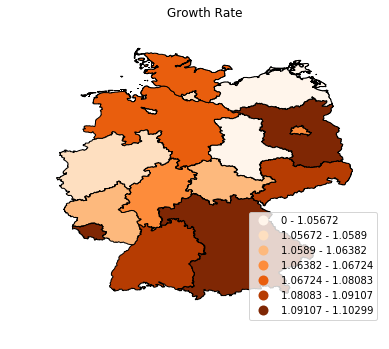

In [225]:
plt.figure(figsize=(14,18))

ax = plt.subplot(121, title = "Growth Rate")
geoplot.choropleth(
    wgf_df, hue=wgf_df.gf, 
    scheme=mapclassify.Quantiles(wgf_df.gf, k=7),
    cmap='Oranges',legend=True, ax=ax
);

#### Conclusion

Bayern and Saarland will stay top hotspots, but also **Brandenburg** has a very high growth rate.